In [ ]:
# preset
!pip install git+https://github.com/openai/CLIP.git
!pip install seaborn scikit-learn

import os
import numpy as np
import torch
from PIL import Image
import clip
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_distances
from sklearn.manifold import TSNE
import re

sns.set(style="whitegrid")

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)


In [2]:
# segment_image
output_dir = "segmented_images"
os.makedirs(output_dir, exist_ok=True)

def segment_image(image, levels=2):
    """8 subplot, and recursively crop from Haut, Bas, Gauche, Droite, and return all subplots and positions"""
    width, height = image.size
    sub_images = []

    def recursive_cut(x, y, w, h, level, position, parent="Main"):
        if level >= levels:
            return

        new_w, new_h = w // 2, h // 2

        # calculate 8 sub areas
        segments = [
            (x, y, new_w, new_h, "Haut-Gauche"),
            (x + new_w, y, new_w, new_h, "Haut-Droite"),
            (x, y + new_h, new_w, new_h, "Bas-Gauche"),
            (x + new_w, y + new_h, new_w, new_h, "Bas-Droite"),
            (x, y, w, new_h, "Haut"),
            (x, y + new_h, w, new_h, "Bas"),
            (x, y, new_w, h, "Gauche"),
            (x + new_w, y, new_w, h, "Droite"),
        ]

        for sx, sy, sw, sh, pos in segments:
            new_pos = f"{parent}_{pos}" if parent != "Main" else pos  # Add the parent's position to the name (Haut_Haut-Droite)
            sub_img = image.crop((sx, sy, sx + sw, sy + sh))
            sub_images.append((sub_img, new_pos))

            # Save the sub-image
            save_path = os.path.join(output_dir, f"{new_pos}.png")
            sub_img.save(save_path)

            # Only Haut, Bas, Gauche, Droite continue
            if pos in ["Haut", "Bas", "Gauche", "Droite"]:
                recursive_cut(sx, sy, sw, sh, level + 1, new_pos, parent=new_pos)

    recursive_cut(0, 0, width, height, 0, "Main")
    return sub_images


In [ ]:
# load full images
image_dir = "/content/dataset"
full_image_files = [f for f in os.listdir(image_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))]
full_images = []
full_image_names = []

for file in full_image_files:
    image_path = os.path.join(image_dir, file)
    try:
        img = Image.open(image_path).convert("RGB")
        full_images.append(img)
        full_image_names.append(file)
    except Exception as e:
        print(f"{file} error：{e}")

print(f"Load {len(full_images)} images")


In [4]:
# Encode the Full images
full_encodings = []
for img in full_images:
    image_input = preprocess(img).unsqueeze(0).to(device)
    with torch.no_grad():
        encoding = model.encode_image(image_input)
    encoding = encoding / encoding.norm(dim=-1, keepdim=True)
    full_encodings.append(encoding.cpu().numpy()[0])
full_encodings = np.array(full_encodings)


In [5]:
# cut the whole images, define level 1 and level 2 based on the position
level1_images = []
level1_names = []
level2_images = []
level2_names = []

for idx, img in enumerate(full_images):
    segs = segment_image(img, levels=2)  # return (sub_img, position)
    # rule：if position includes "_"，it's second level；otherwise first level
    for sub_img, pos in segs:
        if "_" in pos:
            level2_images.append(sub_img)
            level2_names.append(f"{full_image_names[idx]}_{pos}")
        else:
            level1_images.append(sub_img)
            level1_names.append(f"{full_image_names[idx]}_{pos}")

print(f"#first subplot level：{len(level1_images)}")
print(f"second subplot level：{len(level2_images)}")


#first subplot level：288
second subplot level：1152


In [6]:
# Encode with CLIP

# first level subplot encode
level1_encodings = []
for img in level1_images:
    image_input = preprocess(img).unsqueeze(0).to(device)
    with torch.no_grad():
        encoding = model.encode_image(image_input)
    encoding = encoding / encoding.norm(dim=-1, keepdim=True)
    level1_encodings.append(encoding.cpu().numpy()[0])
level1_encodings = np.array(level1_encodings)

# second level subplot encode
level2_encodings = []
for img in level2_images:
    image_input = preprocess(img).unsqueeze(0).to(device)
    with torch.no_grad():
        encoding = model.encode_image(image_input)
    encoding = encoding / encoding.norm(dim=-1, keepdim=True)
    level2_encodings.append(encoding.cpu().numpy()[0])
level2_encodings = np.array(level2_encodings)


In [7]:
# Calculate full image, first level subplot, second level subplot cosine distance. Print out top 10 pairs

def get_top_pairs(encodings, names, top_n=10, exclude_same=True):
    distance_matrix = cosine_distances(encodings)
    pairs = []
    n = len(names)

    def extract_full_name(name):
        m = re.match(r"(.*\.(?:png|jpg|jpeg))_", name, flags=re.IGNORECASE)
        if m:
            return m.group(1)
        else:
            return name

    for i in range(n):
        for j in range(i+1, n):
            if exclude_same:
                id_i = extract_full_name(names[i])
                id_j = extract_full_name(names[j])
                if id_i == id_j:
                    continue
            pairs.append((i, j, distance_matrix[i, j]))
    pairs.sort(key=lambda x: x[2])
    return pairs[:top_n]

# Full image
full_top_pairs = get_top_pairs(full_encodings, full_image_names)
print("(full image) The most similar 10 pairs：")
for i, j, dist in full_top_pairs:
    print(f"{full_image_names[i]} and {full_image_names[j]}: cos distance = {dist:.4f}")

# first level subplot
level1_top_pairs = get_top_pairs(level1_encodings, level1_names)
print("\n (1st level sub image) The most similar 10 pairs：")
for i, j, dist in level1_top_pairs:
    print(f"{level1_names[i]} and {level1_names[j]}: cos distance = {dist:.4f}")

# second level subplot
level2_top_pairs = get_top_pairs(level2_encodings, level2_names)
print("\n (2nd level sub image) The most similar 10 pairs：")
for i, j, dist in level2_top_pairs:
    print(f"{level2_names[i]} and {level2_names[j]}: cos distance = {dist:.4f}")


(full image) The most similar 10 pairs：
wheel_of_fortune_46.jpg and wheel_of_fortune_51.jpg: cos distance = 0.0847
wheel_of_fortune_15.png and wheel_of_fortune_11.jpg: cos distance = 0.0956
wheel_of_fortune_15.png and wheel_of_fortune_8.jpg: cos distance = 0.1034
wheel_of_fortune_38.jpg and wheel_of_fortune_42.jpg: cos distance = 0.1052
wheel_of_fortune_52.jpg and wheel_of_fortune_46.jpg: cos distance = 0.1124
wheel_of_fortune_3.jpg and wheel_of_fortune_2.jpg: cos distance = 0.1188
wheel_of_fortune_15.png and wheel_of_fortune_2.jpg: cos distance = 0.1220
wheel_of_fortune_13.jpg and wheel_of_fortune_6.jpg: cos distance = 0.1236
wheel_of_fortune_21.jpg and wheel_of_fortune_60.jpg: cos distance = 0.1256
wheel_of_fortune_38.jpg and wheel_of_fortune_60.jpg: cos distance = 0.1261

 (1st level sub image) The most similar 10 pairs：
wheel_of_fortune_38.jpg_Bas-Gauche and wheel_of_fortune_51.jpg_Bas-Droite: cos distance = 0.0678
wheel_of_fortune_46.jpg_Haut-Gauche and wheel_of_fortune_51.jpg_Bas

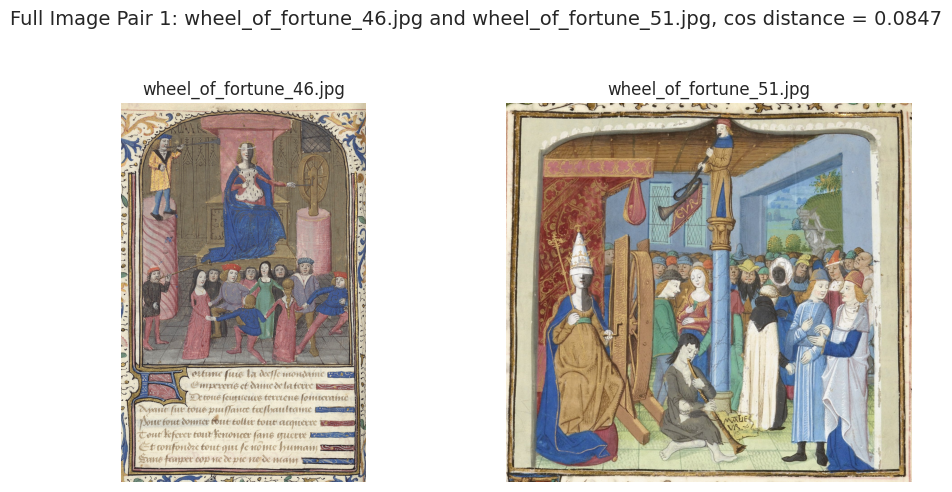

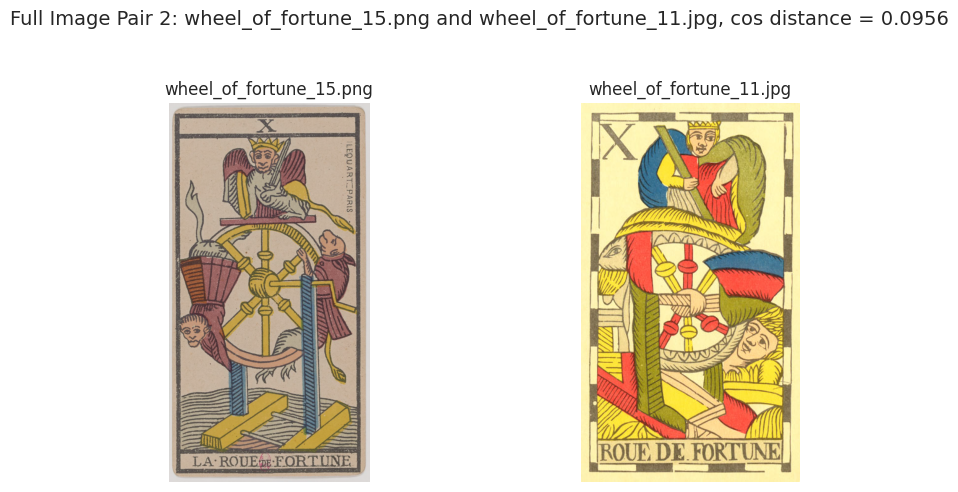

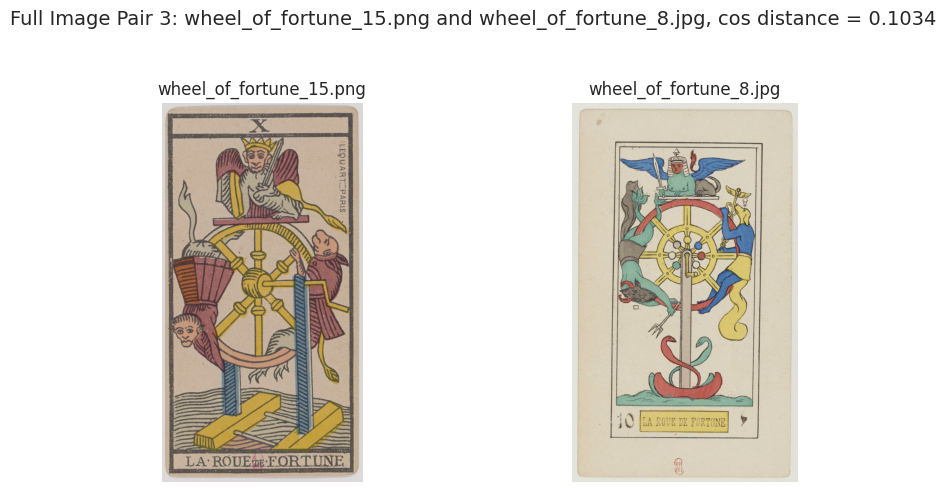

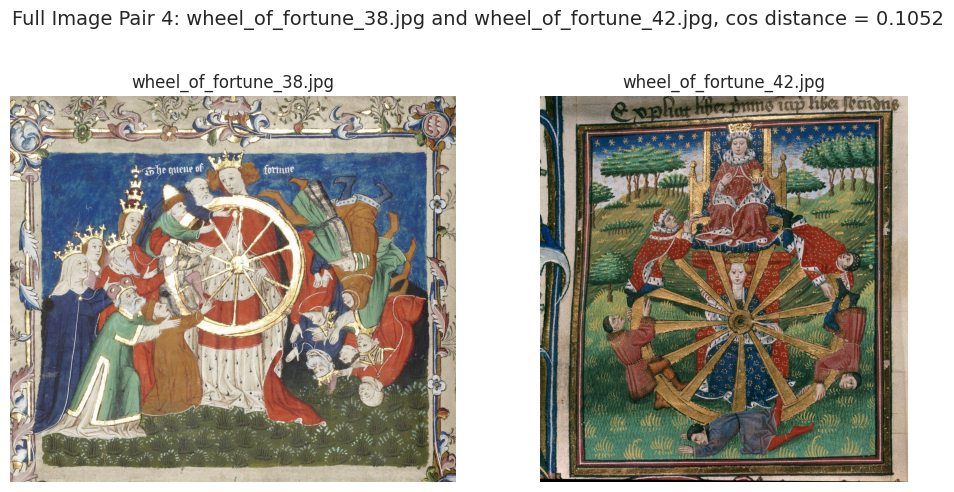

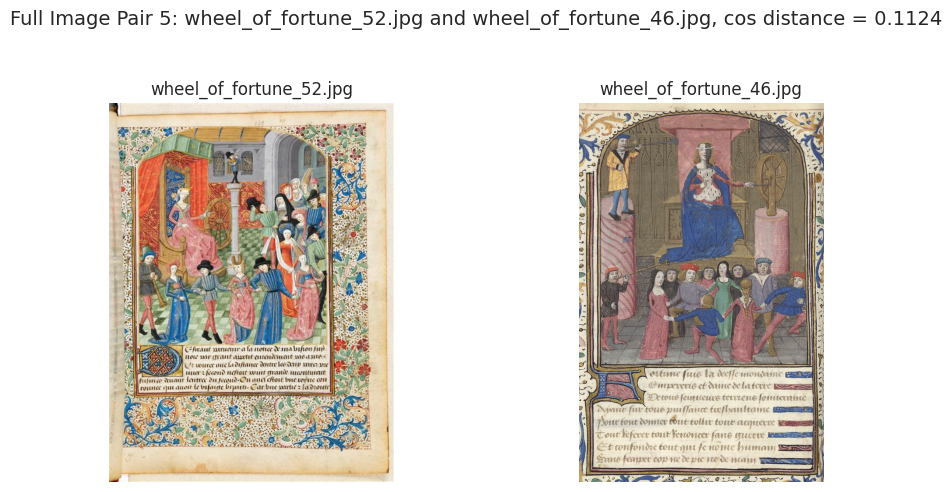

...

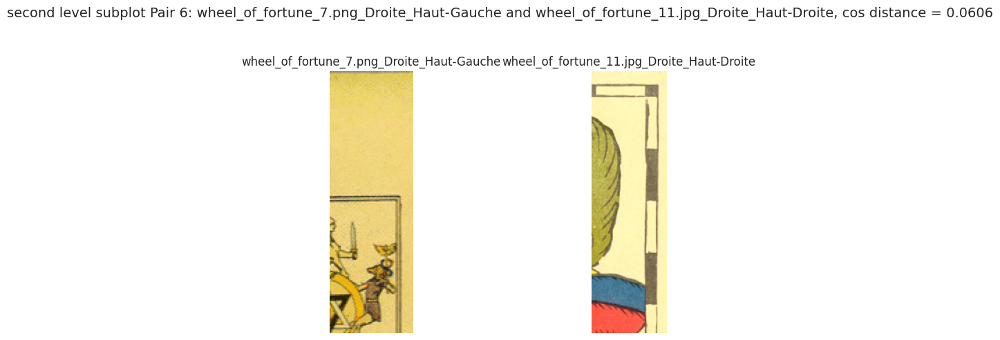

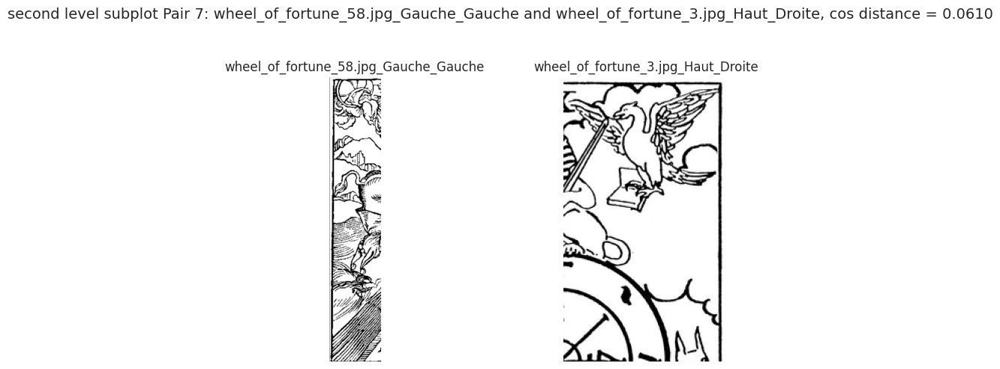

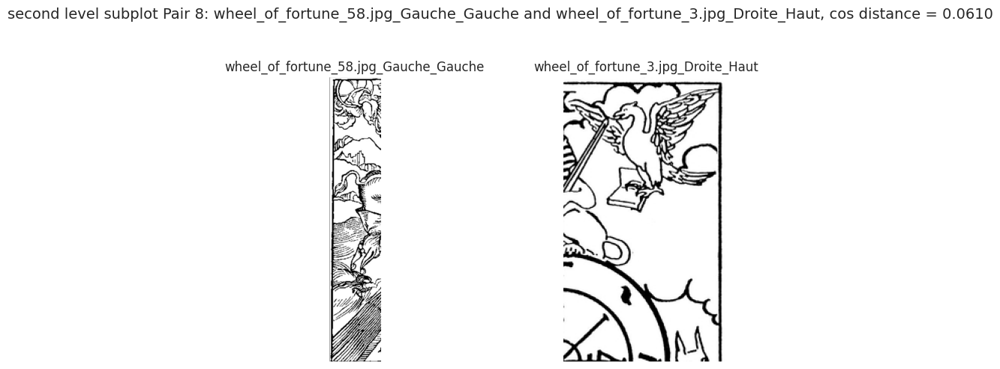

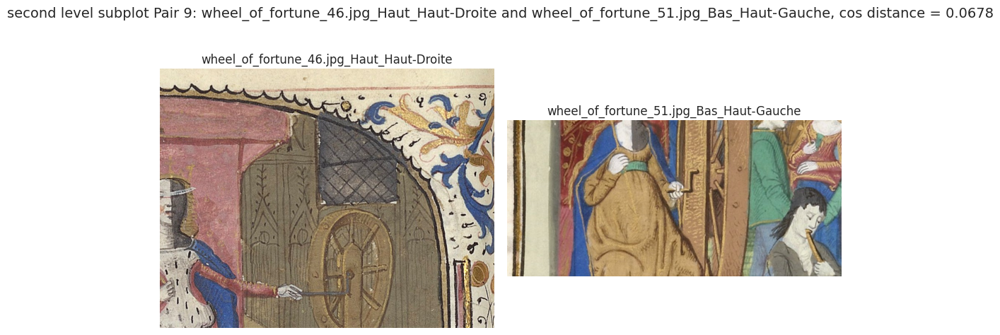

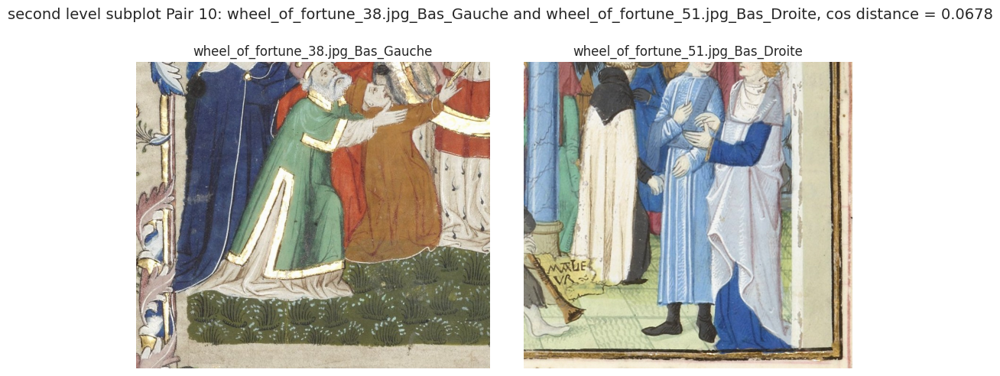

In [8]:
# plot the most similar pairs

def plot_pairs(pairs, names, images, title_prefix=""):
    """
    pairs: list of (i, j, dist)
    names: image name list
    images: iamge list（PIL）
    """
    for idx, (i, j, dist) in enumerate(pairs):
        plt.figure(figsize=(10, 5))
        # Image on the left side
        plt.subplot(1, 2, 1)
        plt.imshow(images[i])
        plt.axis("off")
        plt.title(names[i])
        # Image on the right side
        plt.subplot(1, 2, 2)
        plt.imshow(images[j])
        plt.axis("off")
        plt.title(names[j])
        plt.suptitle(f"{title_prefix} Pair {idx+1}: {names[i]} and {names[j]}, cos distance = {dist:.4f}", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# plot full image pairs
for idx, (i, j, dist) in enumerate(full_top_pairs):
    img1_path = os.path.join(image_dir, full_image_names[i])
    img2_path = os.path.join(image_dir, full_image_names[j])
    img1 = Image.open(img1_path).convert("RGB")
    img2 = Image.open(img2_path).convert("RGB")

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.axis("off")
    plt.title(full_image_names[i])

    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.axis("off")
    plt.title(full_image_names[j])

    plt.suptitle(f"Full Image Pair {idx+1}: {full_image_names[i]} and {full_image_names[j]}, cos distance = {dist:.4f}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# plot first level subplot
plot_pairs(level1_top_pairs, level1_names, level1_images, title_prefix="first level subplot")

# plot second level subplot
plot_pairs(level2_top_pairs, level2_names, level2_images, title_prefix="second level subplot")
